# Optimizing an Island-GA with Different Artists for Aesthetics and SDXL Turbo
Notebook Version: 0.2 (01/03/2024)

In [6]:
from evolutionary.plotting import plot_fitness_statistics
from diffusers.utils import logging
from evolutionary_imaging.processing import create_animation_from_generations, create_generation_image_grid, save_images_from_generation
from datetime import datetime
import torch
import os

In [7]:
logging.disable_progress_bar() # Or else your output will be full of progress bars
logging.set_verbosity_error() # Enable again if you are having problems
os.environ["TOKENIZERS_PARALLELISM"] = "false" # To remove warning of libraries using tokenizers

def save_images_post_evaluation(g, a):
    now = datetime.now()
    time_str = now.strftime("%H%M%S") # append a timestring to avoid overlapping of different GAs when saving images
    save_images_from_generation(a.population, g, time_str)
    
# Check torch random state, used across all libraries. Caution setting fixed seeds as it affects not only generation but also variation.
print(torch.random.get_rng_state())

tensor([239, 109, 204,  ...,   0,   0,   0], dtype=torch.uint8)


In [8]:
from evolutionary_prompt_embedding.argument_types import PooledPromptEmbedData
from evolutionary_prompt_embedding.image_creation import SDXLPromptEmbeddingImageCreator
from evolutionary_prompt_embedding.variation import \
    UniformGaussianMutatorArguments, PooledUniformGaussianMutator, PooledArithmeticCrossover
from evolutionary_prompt_embedding.value_ranges import SDXLTurboEmbeddingRange, SDXLTurboPooledEmbeddingRange
from evolutionary.selectors import TournamentSelector
from evolutionary.algorithms.island_model import IslandModel
from evolutionary.algorithms.ga import GeneticAlgorithm
from evolutionary_imaging.evaluators import AestheticsImageEvaluator

population_size = 10
num_generations = 100
batch_size = 1
elitism = None
inference_steps = 3
artists = [
    "Leonardo da Vinci",  # Renaissance
    "Michelangelo Buonarroti",  # Renaissance
    "Raphael",  # Renaissance
    "Rembrandt van Rijn",  # Dutch Golden Age
    "Johannes Vermeer",  # Dutch Golden Age
    "Claude Monet",  # Impressionism
    "Pierre-Auguste Renoir",  # Impressionism
    "Vincent van Gogh",  # Post-Impressionism
    "Paul Cézanne",  # Post-Impressionism
    "Paul Gauguin",  # Post-Impressionism
    "Georges Seurat",  # Post-Impressionism, Pointillism
    "Gustav Klimt",  # Symbolism, Art Nouveau
    "Edvard Munch",  # Symbolism, Expressionism
    "Henri Matisse",  # Fauvism, Modernism
    "Pablo Picasso",  # Cubism, Surrealism, Modernism
    "Salvador Dalí",  # Surrealism
    "Frida Kahlo",  # Surrealism, Symbolism
    "Jackson Pollock",  # Abstract Expressionism
    "Andy Warhol",  # Pop Art
    "Mark Rothko"  # Abstract Expressionism
]  # 20 Artists


embedding_range = SDXLTurboEmbeddingRange()
pooled_embedding_range = SDXLTurboPooledEmbeddingRange()
creator = SDXLPromptEmbeddingImageCreator(batch_size=batch_size, inference_steps=inference_steps)
evaluator = AestheticsImageEvaluator() 
crossover = PooledArithmeticCrossover(crossover_rate=0.5, crossover_rate_pooled=0.5)
mutation_arguments = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=1.5, 
                                                     clamp_range=(embedding_range.minimum, embedding_range.maximum)) 
mutation_arguments_pooled = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=0.2, 
                                                            clamp_range=(pooled_embedding_range.minimum, pooled_embedding_range.maximum))
mutator = PooledUniformGaussianMutator(mutation_arguments, mutation_arguments_pooled)
selector = TournamentSelector(tournament_size=3)

ga_instances = []

init_crossover = PooledArithmeticCrossover(crossover_rate=0.9, crossover_rate_pooled=0.9)
for artist in artists:
    artist_arg = creator.arguments_from_prompt(f"by {artist}") 

    init_args = [init_crossover.crossover(artist_arg,  # Combine the artist with a random image, weighted towards the artist
                                          PooledPromptEmbedData(embedding_range.random_tensor_in_range(), pooled_embedding_range.random_tensor_in_range())) 
                 for _ in range(population_size)]
    
    # Create and run the genetic algorithm
    ga_instances.append(GeneticAlgorithm(
        population_size=population_size,
        num_generations=num_generations,
        solution_creator=creator,
        evaluator=evaluator,
        mutator=mutator,
        crossover=crossover,
        selector=selector,
        initial_arguments=init_args,
        elitism_count=elitism,
        post_evaluation_callback=save_images_post_evaluation,
    ))

Loaded StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.25.0",
  "_name_or_path": "stabilityai/sdxl-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}


In [9]:
island_model = IslandModel(
    ga_instances,
    migration_size=1,
    migration_interval=1,
)

In [10]:
best_solutions = island_model.run()

100%|██████████| 100/100 [7:33:51<00:00, 272.31s/generation] 


Best solution for artist Leonardo da Vinci: 7.473942756652832
Best solution for artist Michelangelo Buonarroti: 7.427290916442871
Best solution for artist Raphael: 7.487155914306641
Best solution for artist Rembrandt van Rijn: 7.334822177886963
Best solution for artist Johannes Vermeer: 7.067160606384277
Best solution for artist Claude Monet: 7.269300937652588
Best solution for artist Pierre-Auguste Renoir: 7.357651710510254
Best solution for artist Vincent van Gogh: 7.53902530670166
Best solution for artist Paul Cézanne: 7.390417098999023
Best solution for artist Paul Gauguin: 7.316990375518799
Best solution for artist Georges Seurat: 7.529632568359375
Best solution for artist Gustav Klimt: 7.598101615905762
Best solution for artist Edvard Munch: 7.034195899963379
Best solution for artist Henri Matisse: 6.958759784698486
Best solution for artist Pablo Picasso: 7.307531833648682
Best solution for artist Salvador Dalí: 7.225103378295898
Best solution for artist Frida Kahlo: 7.6817212104

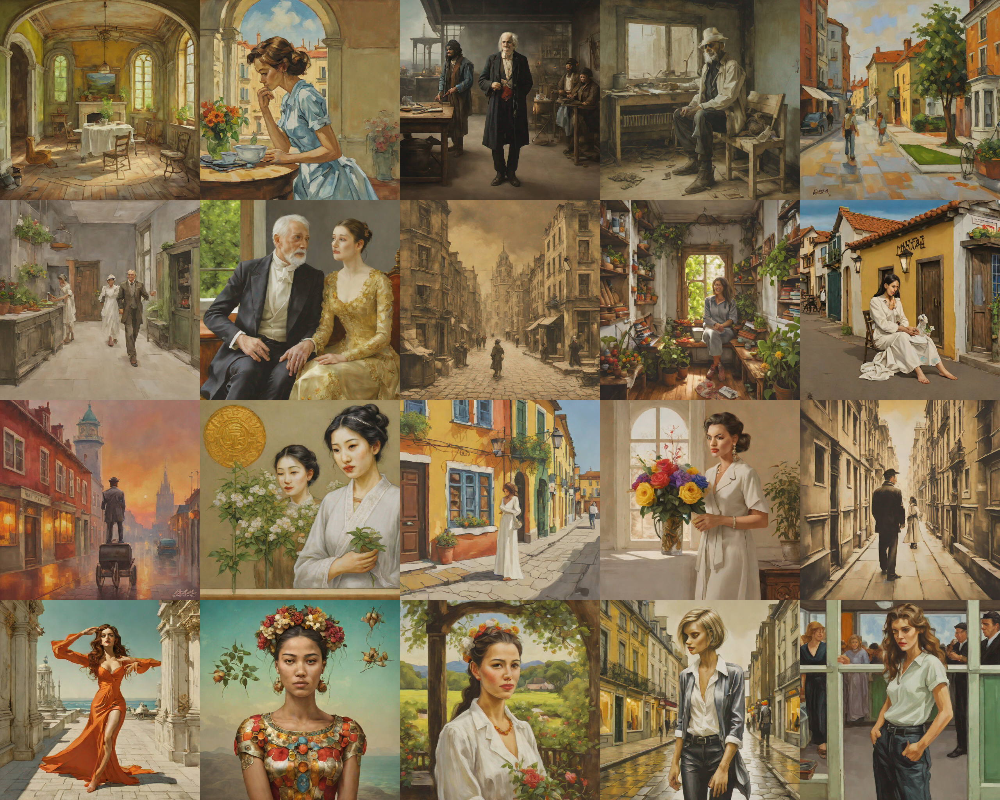

In [13]:
from diffusers.utils import make_image_grid

# Show best solution
for i, best_solution in enumerate(best_solutions):
    print(f"Best solution for artist {artists[i]}: {best_solution.fitness}")

make_image_grid([image for solution in best_solutions for image in solution.result.images], 4, batch_size * len(best_solutions) // 4)

## Plot fitness statistics

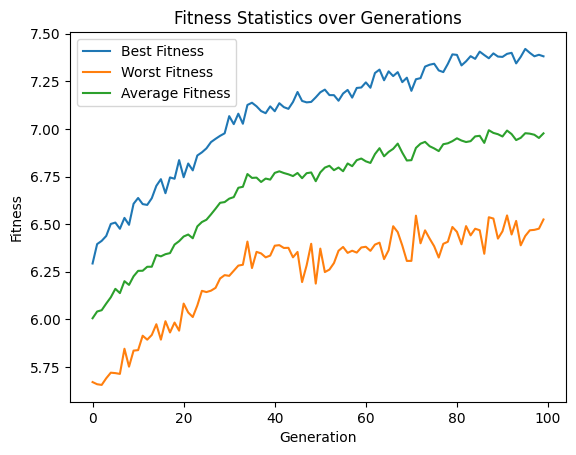

In [16]:
plot_fitness_statistics(num_generations, island_model.best_fitness, island_model.worst_fitness, island_model.avg_fitness)